# CIS680: Project 3: SOLO and FPN (Instance Segmentation)
### Due:
* Part (a) Oct. 17 at 11:59 p.m.
* Part (b) Oct. 24 at 11:59 p.m.

### Instructions:
* This is a group assignment with one submission per group. It is expected that each member of the group will contribute to solving each question. Be sure to specify your teammates when you submit to Gradescope! Collaborating with other groups is not permitted.
* There is no single answer to most problems in deep learning, therefore the questions will often be underspecified. You need to fill in the blanks and submit a solution that solves the (practical) problem. Document the choices (hyperparameters, features, neural network architectures, etc.) you made where specified.
* All the code should be written in Python.
* You may include any code used in previous projects.
* You should expect that a complete training session should last about 6 hours, so you should start part (b) as early as you can!
* To save on compute time, we debugging locally and using colab to train.

## Code Structure
In this assignment, we are only providing the barest templates for your code structure. If you prefer, you can write and debug most of the components in a regular python and only use Jupyter to train. In this case, you might have several files that you import into this notebook, e.g.
* `dataset.py`
* `model.py`
* `train.py`
* `inference.py`

This is shown below. All files should be included in your submission.

In [1]:
try:
    import dataset
    import model
    import train
    import inference
except ModuleNotFoundError:
    pass

In [2]:
if 'google.colab' in str(get_ipython()):
    # Colab specific setup
    assignment_path = '/content/gdrive/My Drive/Colab Notebooks/CIS 680/HW3/'
    
    # Mount your drive
    from google.colab import drive
    drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
!pip install pytorch_lightning

In [4]:
import h5py
import numpy as np
import torch
import torchvision
import statistics
import scipy
import scipy.ndimage
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from torchvision.transforms import Resize
from torchvision.transforms import Normalize
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
from scipy import ndimage
from functools import partial


In [5]:
device = 'cuda' if torch.cuda.is_available else 'cpu'

## Overview

Instance segmentation can be thought of as a combination of object detection and semantic segmentation, the former of which you already explored in the previous project. A visulization of this relationship can be seen in fig. 1.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig1.png" width=500/></div>
<center>Figure 1: An overview of instance segmentation.</center>  

In this project, you are tasked with implementing an instance segmentation framework know as SOLO (Segmenting Object by LOcations). In a similar manner to YOLO, SOLO produces mask predictions on a dense grid. This means that, unlike many other segmenation frameworks (e.g. Mask-RCNN), SOLO directly predicts the segmentation mask without proposing bounding box locations. An visual summary of SOLO can be seen in fig. 2 and 3.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig2.png" width=200/></div>
<center>Figure 2: SOLO.</center>  

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig3.png" width=600/></div>
<center>Figure 3: SOLO branches.</center>

These dense predictions are produced at several different scales using a Feature Pyramid Network (FPN). Using the last few layers of the backbone, we pass the higher level features from the deeper layers back up to larger features scales using lateral connections, shown in fig. 4. The integration of the FPN into your network will be the primary focus of this project.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig4.png" width=300/></div>
<center>Figure 4: SOLO branches.</center>

## Part A

### Dataset
#### Dataset Structure
The dataset used in this project contains three classes across 3265 images: vehicles, people, and animals. The dataset contains the following elements:

* A numpy array of images ($3 \times 300 \times 400$).
* A numpy array of masks ($300 \times 400$).
* A list of ground truth labels by image.
* A list of bounding boxes by image.

Note that the mask array is flattened; to determine which masks belong to which image, count the number of labels associated with that image. For example, if the first few images have 3, 2, and 4 labels, masks 0-2 would belong to image 1, masks 3-4 would belong to image 2, etc. The masks are ordered correctly to allow for this. You can find the dataset set here: https://drive.google.com/drive/folders/1eP7FtPaWfJ5zLdcsZYl6eyn5EYixkFn8

#### Loading and Batching
You should apply the following transformations to each image:
* Normalize pixel values to $[0,1]$.
* Rescale the image to $800 \times 1066$.
* Normalize each channel with means $[0.485, 0.456, 0.406]$ and standard deviations $[0.229, 0.224, 0.225]$.
* Zero pad the iamge to $800 \times 1088$.

Since each image will have a different number of objects, you will have to write your own collation function to properly batch the images. An example collate_fn is shown below, along with expected output dimensions.

In [6]:
# images:         (batch_size, 3, 800, 1088)
# labels:         list with len: batch_size, each (n_obj,)
# masks:          list with len: batch_size, each (n_obj, 800,1088)
# bounding_boxes: list with len: batch_size, each (n_obj, 4)
def collate_fn(batch):
    images = []
    labels = []
    masks = []
    bounding_boxes = []

    for b in batch:
      images.append(b[0])
      labels.append(b[1])
      masks.append(b[2])
      bounding_boxes.append(b[3])
    
    return torch.stack(images), labels, masks, bounding_boxes

In [7]:
class SOLODataset(Dataset):
    def __init__(self, path):
        # Image 3 x 300 x 400
        # Mask 300 x 400
        img_path, mask_path, label_path, bb_path = path
        self.images = h5py.File(img_path, 'r')['data']
        self.masks = h5py.File(mask_path, 'r')['data']
        self.labels = np.load(label_path , allow_pickle=True)
        self.bbs = np.load(bb_path , allow_pickle=True)
        
        self.masks_idx = []
        idx = 0
        for i in range(len(self.labels)):
          self.masks_idx.append(idx)
          idx += len(self.labels[i])
        self.masks_idx = np.array(self.masks_idx)


    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):

        # find image, label, bbox, and corresponding mask
        image = self.images[idx]
        label = self.labels[idx]
        bbox = self.bbs[idx]
        mask = self.masks[self.masks_idx[idx]: self.masks_idx[idx]+len(label)]

        # important numbers
        img_h = image.shape[1]
        img_w = image.shape[2]

        # LABEL
        transform_label = torch.tensor(label)

        # IMAGE
        # Normalize pixel values to [0,1]
        transform_image = torch.from_numpy((image / 255.0).astype('float32'))
        # Rescale the images to 800 x 1066
        transform_image = torch.nn.functional.interpolate(transform_image.unsqueeze(dim=0), size=(800, 1066))
        transform_image = transform_image.squeeze(dim=0)
        # Normalize each channel with means  [0.485,0.456,0.406]  and standard deviations  [0.229,0.224,0.225] .
        transform_image = torchvision.transforms.functional.normalize(transform_image, mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
        #Zero pad the image to  800 x 1088
        transform_image = torch.nn.functional.pad(transform_image, (11,11))
        
        # MASK 
        transform_mask = torch.from_numpy((mask.astype('float32')))
        transform_mask = torch.nn.functional.interpolate(transform_mask.unsqueeze(dim=0), size=(800, 1066))
        transform_mask = transform_mask.squeeze(dim=0)
        transform_mask = torch.nn.functional.pad(transform_mask, (11,11))

        # BBOXES
        transform_bbox = np.zeros_like(bbox)
        
        x1, y1, x2, y2 = bbox[:,0], bbox[:,1], bbox[:,2], bbox[:,3]
        transform_bbox[:, 0] = bbox[:,0]/img_w
        transform_bbox[:, 1] = bbox[:,1]/img_h
        transform_bbox[:, 2] = bbox[:,2]/img_w
        transform_bbox[:, 3] = bbox[:,3]/img_h

        return transform_image, transform_label, transform_mask, transform_bbox

#### Visualization
In order to validate that you are loading the dataset correct, you should plot at least five example images that include the mask, annotations, and bounding boxes. Examples of such images are shown in fig. 5 and 6. Make sure that the color for each class is consistent!

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig5.png" width=500/></div>
<center>Figure 5: Example visualization.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig6.png" width=500/></div>
<center>Figure 6: Example visualization.</center>

In [8]:
def visualize_data(imgs, labels, masks, bboxs):

  # process image batch
  imgs_display = torch.clone(imgs).permute(0, 2, 3, 1)

  # set alpha parameter for blending
  alpha = 0.8

  # iterate through each image in the batch
  for idx, img in enumerate(imgs_display):
    fig, ax = plt.subplots()
    label = labels[idx]
    mask = masks[idx]
    bbox = bboxs[idx]

    # iterate through each label in the image
    for i in range(len(label)):
      m = mask[i]
      l = label[i]
      if l == 1:
        color = [0, 0, 1] 
      elif l == 2:
        color = [0, 1, 0]  
      else:
        color = [1, 0, 0] 
      
      img[:, :, 0] = torch.where(m == 1, img[:, :, 0] * (1 - alpha) + color[0] * alpha, img[:, :, 0])
      img[:, :, 1] = torch.where(m == 1, img[:, :, 1] * (1 - alpha) + color[1] * alpha, img[:, :, 1])
      img[:, :, 2] = torch.where(m == 1, img[:, :, 2] * (1 - alpha) + color[2] * alpha, img[:, :, 2])

    ax.imshow(img)
    
    # bounding boxes
    img_h = img.shape[0]
    img_w = img.shape[1] - 22

    for box in bbox:
      box = [int(box[0]*img_w + 11), int(box[1]*img_h), int(box[2]*img_w + 11), int(box[3]*img_h)]
      rect = patches.Rectangle((box[0],box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='r', facecolor='none')
      ax.add_patch(rect)

  plt.show()

### Model
#### Architecture
The model architecture is summarized in fig. 7 and tables 1 and 2.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig7.png" width=500/></div>
<center>Figure 7: SOLO branch structure.</center>
<br>
<center>Table 1: Category branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 3\times3\times(C-1)$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note $C = 4$ here (number of classes + background). |

<br>
<center>Table 2: Mask branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Two additional input channels are described in the "Forward" section. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 1\times1\times(\text{num_grid})^2$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note that $\text{num_grid}$ is different for each layer of the FPN. |

We will be using a pretrained backbone (which includes an FPN), so you will not have to implement those components. A template for the network with along with default parameters is shown below.

#### Feature Pyramid
The feature pyramid extracted below has strides $[4,8,16,32,64]$ over the original image. To match the SOLO paper, this should be interpolated to have strides $[8,8,16,32,32]$.

#### Target Assignment
Some notes about generating the ground truth targets:
* The FPN levels can be though of as different grid sizes cut through the image.
* You assign each target to a certain FPN level if $\sqrt{wh}$ from the bounding box falls within the `scale_range` associated with that level. Note that these overlap, so you may assign the same target to multiple levels.
* A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.
 * The centre region of an object is its bounding box scaled by `epsilon`.
 * Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell.
 
#### Target Visualization
You should produce visualizations such as fig. 8 and 9 to validate your target assignments.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig8.png" width=500/></div>
<center>Figure 8: Target assignment example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig9.png" width=500/></div>
<center>Figure 9: Target assignment example.</center>

In [58]:
import pytorch_lightning as pl
import pdb

class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    }
    
    
    def __init__(self, **kwargs):
        super().__init__()
        for k, v in {**self._default_cfg, **kwargs}.items():
            setattr(self, k, v)
        
        pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
        self.backbone = pretrained_model.backbone
        
        self.stacked_convs = SOLO._default_cfg['stacked_convs']
        self.in_channels = SOLO._default_cfg['in_channels']
        self.out_channels = SOLO._default_cfg['seg_feat_channels']
        self.num_grids = SOLO._default_cfg['num_grids']
        self.C = SOLO._default_cfg['num_classes']
        self.cate_loss_cfg = SOLO._default_cfg['cate_loss_cfg']
        self.postprocess_cfg = SOLO._default_cfg['postprocess_cfg']

        # Initialize Layers
        self.cate_head = nn.ModuleList()
        self.mask_head = nn.ModuleList()

        for i in range(self.stacked_convs):
        # Category branch head
          self.cate_head.append(nn.Sequential(
              nn.Conv2d(self.in_channels, self.out_channels, kernel_size=(3,3), stride=1, padding=1, bias=False), 
              nn.GroupNorm(num_groups=32, num_channels= self.out_channels), 
              nn.ReLU(True))
              )
        # Mask branch head
          in_channels_mask = self.in_channels + 2 if i == 0 else self.in_channels
          self.mask_head.append(nn.Sequential(
              nn.Conv2d(in_channels_mask, self.out_channels, kernel_size=(3,3), stride=1, padding=1, bias=False), 
              nn.GroupNorm(num_groups=32, num_channels= self.out_channels), 
              nn.ReLU(True))
              )

        self.cate_output = nn.Sequential(nn.Conv2d(self.in_channels, self.C-1, kernel_size=(3,3), stride=1, padding=1, bias=True), nn.Sigmoid())
        self.mask_output = nn.ModuleList()
        for n in self.num_grids:
          self.mask_output.append(nn.Sequential(nn.Conv2d(self.in_channels, n**2, kernel_size=(1,1), padding=0, bias=True), nn.Sigmoid()))


        # Initiliaze weights
        # Category branch
        for l in self.cate_head:
          if isinstance(l , nn.Conv2d):
            nn.init.xavier_uniform_(l.weight)
            if l.bias:
              nn.init.zeros_(l.bias)

        # Mask branch
        for l in self.mask_head:
          if isinstance(l, nn.Conv2d):
            nn.init.xavier_uniform_(l.weight)
            if l.bias:
              nn.init.zeros_(l.bias)

        # mask out
        for l in self.cate_output:
          if isinstance(l, nn.Conv2d):
            nn.init.xavier_uniform_(l.weight)
            nn.init.zeros_(l.bias)

        for l in self.mask_output:
          if isinstance(l, nn.Conv2d):
            nn.init.xavier_uniform_(l.weight)
            nn.init.zeros_(l.bias)


    # Forward function should calculate across each level of the feature pyramid network.
    # Input:
    #     images: batch_size number of images
    # Output:
    #     if eval = False
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, 2*feature_h, 2*feature_w)
    #     if eval==True
    #         category_predictions: list, len(fpn_levels), each (batch_size, S, S, C-1)
    #         / after point_NMS
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    #         / after upsampling

    def MultiApply(self, func, *args, **kwargs):
      pfunc = partial(func, **kwargs) if kwargs else func
      map_results = map(pfunc, *args)

      return tuple(map(list, zip(*map_results)))

    # DEFINED forward function
    def forward(self, images, eval=True):
      # you can modify this if you want to train the backbone
      feature_pyramid = [v.detach() for v in self.backbone(images).values()]
      feature_pyramid[0] =  F.interpolate(feature_pyramid[0], scale_factor=0.5)
      feature_pyramid[4] =  F.interpolate(feature_pyramid[4], scale_factor=2.0)
    
      cate_preds, mask_preds = self.MultiApply(self.forward_single_level, 
                                                feature_pyramid,list(range(len(feature_pyramid))), eval=eval)

      return cate_preds, mask_preds


    def forward_single_level(self, fpn_feat, idx, eval=False):
      num_grid = self.num_grids[idx]
      cate_pred = fpn_feat
      mask_pred = fpn_feat
      # Category Branch
      cate_pred = F.interpolate(cate_pred, size=(num_grid, num_grid), mode='bilinear')

      for layer in self.cate_head:
        cate_pred = layer(cate_pred)
      cate_pred = self.cate_output(cate_pred)

      # Mask Branch
      bsz, ch, h, w = mask_pred.size(dim=0), mask_pred.size(dim=1) , mask_pred.size(dim=2) , mask_pred.size(dim=3)
      x, y = torch.meshgrid(torch.linspace(-1,1,h), torch.linspace(-1,1,w))
      x = x.expand((bsz, 1, -1, -1))
      y = y.expand((bsz, 1, -1, -1))
      coord_conv = torch.cat((x, y), 1)
      mask_pred = torch.cat((mask_pred, coord_conv.to(mask_pred.device)), 1)

      for layer in self.mask_head:
        mask_pred = layer(mask_pred)

      if eval == False:
        mask_pred = F.interpolate(mask_pred, scale_factor=2, mode='bilinear')
      else:
        mask_pred = F.interpolate(mask_pred, size=(int(800/4), int(1088/4)), mode='bilinear')

      mask_pred = self.mask_output[idx](mask_pred)

      if eval == True:
        cate_pred = self.points_nms(cate_pred)

      return cate_pred, mask_pred

    
    # This function build the ground truth tensor for each batch in the training

    # input:
      # bbox: n_obj, 4 (x1y1x2y2 system)
      # label: n_obj,
      # mask: n_obj, H_ori, W_ori
    # output:
      # ins_label_list: list, len: len(FPN), (S^2, 2H_feat, 2W_feat)
      # cate_label_list: list, len: len(FPN), (S, S)
      # ins_ind_label_list: list, len: len(FPN), (S^2, )
    
    def target_single_img(self, bbox, label, mask):
        img_h = mask.shape[1] # 800
        img_w = mask.shape[2] # 1088
        s = SOLO._default_cfg['scale_ranges']
        eps = SOLO._default_cfg['epsilon']
        S = SOLO._default_cfg['num_grids']
        
        # feature maps for mask_targets
        fp =[(100, 136), (100, 136), (50, 68), (25, 34), (26,34)]

        # return lists
        category_targets = []
        mask_targets = []
        active_masks = []

        fpn_indices = [[] for _ in range(len(s))]

        # find the scale for each bounding box
        for idx_bb in range(len(bbox)):
            box = torch.tensor(bbox[idx_bb])
            # extract √area
            h, w = box[3] - box[1], box[2] - box[0]
            h, w = img_h * h, img_w * w
            # find scale range 
            bb_scale = torch.sqrt(h*w)

            # feature pyramid indices
            if s[0][0] < bb_scale < s[0][1]:
                fpn_indices[0].append(idx_bb)
            if s[1][0] < bb_scale < s[1][1]:
                fpn_indices[1].append(idx_bb)
            if s[2][0] < bb_scale < s[2][1]:
                fpn_indices[2].append(idx_bb)
            if s[3][0] < bb_scale < s[3][1]:
                fpn_indices[3].append(idx_bb)
            if s[4][0] < bb_scale < s[4][1]:
                fpn_indices[4].append(idx_bb)

        # go through the fpn and find the center regions and centers of each box
        for fpn_idx, mask_idx in enumerate(fpn_indices):
          # category_target_one_fpn = torch.zeros((S[fpn_idx], S[fpn_idx])).to(device)
          # mask_target_one_fpn = torch.zeros((S[fpn_idx] * S[fpn_idx], 2*fp[fpn_idx][0], 2*fp[fpn_idx][1])).to(device)
          # active_mask_one_fpn = torch.zeros((S[fpn_idx] * S[fpn_idx]), dtype=torch.bool).to(device)
          #print(fpn_idx)   the current level
          #print(mask_idx)   the mask incides in that level
          category_target_fpn = torch.zeros((S[fpn_idx], S[fpn_idx]), device=device)
          mask_target_fpn = torch.zeros((S[fpn_idx] * S[fpn_idx], 2*fp[fpn_idx][0], 2*fp[fpn_idx][1]), device=device)
          active_mask_fpn = torch.zeros((S[fpn_idx] * S[fpn_idx]), dtype=torch.bool, device=device)
          
          #for idx, mask_fpn in enumerate(mask[mask_idx]):  
          for mask_num in mask_idx:   # mask_idx gives corresponding mask indices in this fpn level, mask_num is iterating value
            # find normalized center and width and height
            cy, cx = scipy.ndimage.measurements.center_of_mass(mask[mask_num].cpu().numpy())
            cy, cx = cy/img_h, cx/img_w

            box = bbox[mask_num]
            h, w = box[3] - box[1], box[2] - box[0]
            h_eps, w_eps = h*eps, w*eps

            # find what these correspond to in grid cells and restrict to 3x3 if larger than that
            cy_grid, cx_grid = np.floor(cy * S[fpn_idx]), np.floor(cx * S[fpn_idx])

            x_box_min = cx - (0.5 * w_eps)
            y_box_min = cy - (0.5 * h_eps)
            x_box_max = cx + (0.5 * w_eps)
            y_box_max = cy + (0.5 * h_eps)
            #print('normalized box values: ', x_box_min , y_box_min, x_box_max, y_box_max)

            y_max = min(y_box_max * S[fpn_idx], cy_grid + 1)
            y_min = max(y_box_min * S[fpn_idx], cy_grid - 1)
            x_min = max(x_box_min * S[fpn_idx], cx_grid - 1)
            x_max = min(x_box_max * S[fpn_idx], cx_grid + 1)

            x_min = int(max(0, x_min))
            x_max = int(min(S[fpn_idx]-1, x_max))
            y_min = int(max(0, y_min))
            y_max = int(min(S[fpn_idx]-1, y_max))

            category_target_fpn[y_min: y_max + 1, x_min: x_max + 1] = label[mask_num]

            # fill in active mask information
            x, y = np.meshgrid(np.arange(x_min, x_max+1), np.arange(y_min, y_max + 1))
            new_idx = S[fpn_idx] * y + x

            for n in new_idx:
              active_mask_fpn[n] = True

            # fill in mask targets
            mask_interpolate = torch.nn.functional.interpolate(mask[mask_num].unsqueeze(0).unsqueeze(0), size=(2*fp[fpn_idx][0], 2*fp[fpn_idx][1]))
            mask_interpolate = mask_interpolate.squeeze(dim=0).squeeze(0)
            for n in new_idx:
              mask_target_fpn[n] = mask_interpolate.to(device)


          category_targets.append(category_target_fpn)
          active_masks.append(active_mask_fpn)
          mask_targets.append(mask_target_fpn)


        return mask_targets, active_masks, category_targets
    
    
    # This function build the ground truth tensor for each batch in the training    
    def target(self, bbox_list, label_list, mask_list):
    # Input:
      # bbox_list: list, len(batch_size), each (n_object, 4) (x1y1x2y2 system)
      # label_list: list, len(batch_size), each (n_object, )
      # mask_list: list, len(batch_size), each (n_object, 800, 1088)
    # Output:
      # ins_gts_list: list, len(bz), list, len(fpn), (S^2, 2H_f, 2W_f)
      # ins_ind_gts_list: list, len(bz), list, len(fpn), (S^2,)
      # cate_gts_list: list, len(bz), list, len(fpn), (S, S), {1,2,3}

      # parallely compute for every image in batch
      ins_gts_list, ins_ind_gts_list, cate_gts_list = self.MultiApply(self.target_single_img, bbox_list, label_list, mask_list)

      return ins_gts_list, ins_ind_gts_list, cate_gts_list


    # focal loss for classification
    def focal_loss(self, cate_preds, cate_targets):

        gamma = self.cate_loss_cfg['gamma']
        eps = 1e-9
        alpha = self.cate_loss_cfg['alpha']

        cate_preds = cate_preds.flatten()
        one_hot_targets = F.one_hot(cate_targets.long(), num_classes=4)
        one_hot = one_hot_targets[:,1:]
        one_hot = one_hot.flatten()

        # y = 1 case values
        p_one = one_hot * cate_preds
        p_one = p_one[p_one > 0]
        y_one = torch.sum(-alpha * torch.pow(1 - p_one, gamma) * torch.log(p_one))

        # y otherwise
        p_other = (1 - one_hot) * cate_preds
        p_other = p_other[p_other > 0]
        y_other = torch.sum(-(1-alpha) * torch.pow(p_other, gamma) * torch.log(1 - p_other))
        
        m = one_hot.shape[0]
        focal_loss = (y_other + y_one) / (m + eps)

        return focal_loss

    # dice loss for segmentation
    def dice_loss(self, mask_preds, mask_targets):
        d_mask = 0
        eps = 1e-9

        for p, q in zip(mask_preds, mask_targets):
          for i in range(len(q)): 
            d_mask += 1 - (2* (p[i]*q[i]).sum()) / ((p[i]**2).sum() + (q[i]**2).sum())

        N_pos = sum([len(q) for q in mask_targets])

        return d_mask/ (N_pos + eps)


    def loss(self, cate_preds, cate_targets, mask_preds, mask_targets, active_masks):

        # Convert list of catergorical and mask results to H x W
        # ins_gts: list, len(fpn), (active_across_batch, 2H_feat, 2W_feat)
        # ins_preds: list, len(fpn), (active_across_batch, 2H_feat, 2W_feat)
        

        mask_targets = [torch.cat([mask_labels_level_img[mask_ind_labels_level_img, ...]
            for mask_labels_level_img, mask_ind_labels_level_img in
            zip(mask_labels_level, mask_ind_labels_level)], 0)
                for mask_labels_level, mask_ind_labels_level in
                zip(zip(*mask_targets), zip(*active_masks))]

        mask_preds = [torch.cat([mask_preds_level_img[mask_ind_labels_level_img, ...]
            for mask_preds_level_img, mask_ind_labels_level_img in
            zip(mask_preds_level, mask_ind_labels_level)], 0)
                for mask_preds_level, mask_ind_labels_level in
                zip(mask_preds, zip(*active_masks))]

        # cate_gts: (bz*fpn*S^2,), img, fpn, grids
        # cate_preds: (bz*fpn*S^2, C-1), ([img, fpn, grids], C-1)
        cate_targets = [torch.cat([cate_targets_level_img.flatten()
            for cate_targets_level_img in cate_targets_level]) # cate_gts_level_img.flatten() is (S^2,)
                for cate_targets_level in zip(*cate_targets)]
        cate_targets = torch.cat(cate_targets)
        cate_preds = [cate_preds_level.permute(0,2,3,1).reshape(-1, self.C-1)
            for cate_preds_level in cate_preds]
        cate_preds = torch.cat(cate_preds, 0)

        # Compute loss
        cate_loss = self.focal_loss(cate_preds, cate_targets)
        mask_loss = self.dice_loss(mask_preds, mask_targets)

        total_loss = self.cate_loss_cfg['weight'] * cate_loss + self.mask_loss_cfg['weight'] *  mask_loss
        return total_loss, cate_loss, mask_loss


    def points_nms(self, heat, kernel=2):
      # kernel must be 2
      hmax = F.max_pool2d(
          heat, (kernel, kernel), stride=1, padding=1)
      keep = (hmax[:, :, :-1, :-1] == heat).float()
      return heat * keep

    def MatrixNMS(self, sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
      n = len(sorted_scores)
      sorted_masks = sorted_masks.reshape(n, -1)
      intersection = torch.mm(sorted_masks, sorted_masks.T)
      areas = sorted_masks.sum(dim=1).expand(n, n)
      union = areas + areas.T - intersection
      ious = (intersection / union).triu(diagonal=1)

      ious_cmax = ious.max(0)[0].expand(n, n).T
      if method == 'gauss':
          decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
      else:
          decay = (1 - ious) / (1 - ious_cmax)
      decay = decay.min(dim=0)[0]
      return sorted_scores * decay

    
    #Input
    # cate_preds : list, len(fpn_levels), each (batch_size, C-1, S, S)
    # / after points_nms
    # mask_preds : list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    # / after upsampling
    # active_masks : list, len(batch_size), list, len(fpn), (S^2,)

    # Output
    # sorted_masks: (n_active, image_h/4, image_w/4)
    # sorted_scores: (n_active,)
    def post_process(self, cate_preds, mask_preds):
      cate_thresh = SOLO._default_cfg['postprocess_cfg']['cate_thresh']
      #cate_thresh = 1e-09
      pre_NMS_num = SOLO._default_cfg['postprocess_cfg']['pre_NMS_num']
      mask_thresh= SOLO._default_cfg['postprocess_cfg']['mask_thresh']
      #mask_thresh = 1e-06
      keep_instance = SOLO._default_cfg['postprocess_cfg']['keep_instance']

      confidence_scores = torch.zeros(len(cate_preds))
      cate_preds_scores = []
      cate_preds_indices = []
      #mask_preds_ = []

      # Compute confidence score of every prediction
      for c in range(len(cate_preds)): # iterate through levels
        cate_preds[c] = cate_preds[c].reshape(3, -1) # (C-1, S^2)
        cp_scores, cp_indices = torch.max(cate_preds[c], 0) # (S^2)
        cate_preds_scores.append(cp_scores)
        cate_preds_indices.append(cp_indices) 

      # concatenate all scores and labels across levels
      # 3872 first dimension 
      cate_preds_scores_all = torch.cat((cate_preds_scores[0], cate_preds_scores[1], cate_preds_scores[2], cate_preds_scores[3], cate_preds_scores[4]))
      cate_preds_classes_all = torch.cat((cate_preds_indices[0], cate_preds_indices[1], cate_preds_indices[2], cate_preds_indices[3], cate_preds_indices[4]))
      mask_preds_all = torch.cat([mask_preds[i][0] for i in range(5)], dim=0)

      # use a confidence threshold to filter out predictions with low confidence  
      idx = (cate_preds_scores_all > cate_thresh).nonzero()[:, 0]
      
      cate_preds_scores_filtered = cate_preds_scores_all[idx]
      cate_preds_classes_filtered = cate_preds_classes_all[idx]
      mask_preds_filtered = mask_preds_all[idx]

      #print(cate_preds_scores_filtered)
      #print(cate_preds_classes_filtered)

      # compute maskness and convert masks to binary masks
      for i, m in enumerate(mask_preds_filtered):
        N_f = (m > mask_thresh).sum((0,1))
        num = m[m > mask_thresh].sum()
        maskness_factor = num / (N_f + 1e-09)
        cate_preds_scores_filtered[i] *= maskness_factor # multiply scores by maskness factor 
        mask_preds_filtered[i] = mask_preds_filtered[i] > mask_thresh # convert to binary mask

      # find sorted scores and mask scores
      sorted_idx = torch.argsort(cate_preds_scores_filtered, descending=True)[:pre_NMS_num]
      sorted_scores = cate_preds_scores_filtered[sorted_idx]
      sorted_masks = mask_preds_filtered[sorted_idx]
      sorted_classes = cate_preds_classes_filtered[sorted_idx]


      # Perform matrix NMS
      decay_scores = self.MatrixNMS(sorted_masks, sorted_scores)
      
      # sort the decay scores
      sorted_post_nms_decay = torch.argsort(decay_scores, descending=True)[:keep_instance]
      sorted_post_nms_scores = decay_scores[sorted_post_nms_decay]
      sorted_post_nms_classes = sorted_classes[sorted_post_nms_decay] + 1
      sorted_post_nms_masks = F.interpolate(sorted_masks[sorted_post_nms_decay].unsqueeze(0), scale_factor=4, mode='bilinear')
      sorted_post_nms_masks = sorted_post_nms_masks.squeeze(0)

      #print('top 5 decay scores ', sorted_post_nms_scores)
      #print('top 5 classes ', sorted_post_nms_classes)

      #print(sorted_post_nms_scores.shape)
      #print(sorted_post_nms_masks.shape)
      #print(sorted_post_nms_classes.shape)
      #print(f"Unique classes predicted: {torch.unique(sorted_post_nms_classes), dtype=torch.long}")
     
      return sorted_post_nms_scores, sorted_post_nms_classes, sorted_post_nms_masks

    def plot_inference(self, nms_sorted_scores, nms_sorted_cate_labels, nms_sorted_masks, images):
      """
      nms_sorted_scores : list, len(batch_size), (keep_instance, )
      nms_sorted_cate_labels : list, len(batch_size), (keep_instance, )
      nms_sorted_masks : list, len(batch_size), (keep_instance, ori_h, ori_w)
      color_list : ["jet", "ocean", "Spectral"]
      images : (batch_size, 3, ori_h, ori_w)
      """
      from matplotlib import cm


      cate_thresh= SOLO._default_cfg['postprocess_cfg']['cate_thresh']
      mask_thresh= SOLO._default_cfg['postprocess_cfg']['mask_thresh']

      # convert color_list
      rgb_color_list = []
      color_list = ["jet", "ocean", "Spectral"]
      # configure the color list 
      for color_str in color_list:
            color_map = cm.ScalarMappable(cmap=color_str)
            rgb_color_list.append(np.array(color_map.to_rgba(0))[:3])

      # iterate through images
      for i in range(len(images)):
        img_new = torch.clone(images[i]).permute(1,2, 0)
        #img_new = np.tranpose(img_new.numpy()) # img is 3xHxW -> tranpose to HxWx3
        img_masks = nms_sorted_masks[i]
        img_scores = nms_sorted_scores[i]
        img_labels = nms_sorted_cate_labels[i]

        for idx in range(len(img_masks)):
          # no predicted masks
          if len(img_masks) == 0:
            break
          # under threshold continue
          if img_scores[idx] < cate_thresh:
            continue
          
          # convert to binary mask and extract label
          m = img_masks[idx] >= mask_thresh
          l = img_labels[idx]
          color = rgb_color_list[l-1]

          # place on image
          alpha = 0.8
          img_new[:, :, 0] = torch.where(m == 1, img_new[:, :, 0] * (1 - alpha) + color[0] * alpha, img_new[:, :, 0])
          img_new[:, :, 1] = torch.where(m == 1, img_new[:, :, 1] * (1 - alpha) + color[1] * alpha, img_new[:, :, 1])
          img_new[:, :, 2] = torch.where(m == 1, img_new[:, :, 2] * (1 - alpha) + color[2] * alpha, img_new[:, :, 2])

        plt.imshow(img_new)
        plt.show()

    def training_step(self, batch, batch_idx):
        img, label, mask, bbox = batch
        mask_targets, active_masks, cate_targets = self.target(bbox, label, mask)
        cate_preds, mask_preds = self.forward(img, eval=False)
        loss, cate_loss, mask_loss = self.loss(cate_preds, cate_targets, mask_preds, mask_targets, active_masks)
        #print(f"Total Loss:{loss}")
        #print(f"Category Loss:{cate_loss}")
        #print(f"Mask Loss:{mask_loss}")
        self.log('loss', loss)
        self.log('cate_loss', cate_loss)
        self.log('mask_loss', mask_loss)


        return {'loss': loss, 'cate_loss':cate_loss.detach(), 'mask_loss':mask_loss.detach()}

    def training_epoch_end(self, outputs):
        avg_loss = torch.stack([x['loss'] for x in outputs]).mean()
        avg_cate_loss = torch.stack([x['cate_loss'] for x in outputs]).mean()
        avg_mask_loss = torch.stack([x['mask_loss'] for x in outputs]).mean()

        total_loss.append(avg_loss)
        cate_loss.append(avg_cate_loss)
        mask_loss.append(avg_mask_loss)

        print(f"Training Stats:")
        print(f"epoch : {self.current_epoch}")
        print(f"Average total loss per epoch:{avg_loss}")
        print(f"Average category loss per epoch:{avg_cate_loss}")
        print(f"Average mask loss per epoch:{avg_mask_loss}")
        return
    
    def validation_step(self, batch, batch_idx):
        img, label, mask, bbox = batch
        mask_targets, active_masks, cate_targets = self.target(bbox, label, mask)
        cate_preds, mask_preds = self.forward(img, eval=False)
        loss, cate_loss, mask_loss = self.loss(cate_preds, cate_targets, mask_preds, mask_targets, active_masks)
        #print(f"Total Loss:{loss}")
        #print(f"Category Loss:{cate_loss}")
        #print(f"Mask Loss:{mask_loss}")
        self.log('val_loss', loss)
        self.log('val_cate_loss', cate_loss)
        self.log('val_mask_loss', mask_loss)


        return {'val_loss': loss, 'val_cate_loss':cate_loss, 'val_mask_loss':mask_loss}

    def validation_epoch_end(self, outputs):
        avg_val_loss = torch.stack([x['val_loss'] for x in outputs]).mean()
        avg_val_cate_loss = torch.stack([x['val_cate_loss'] for x in outputs]).mean()
        avg_val_mask_loss = torch.stack([x['val_mask_loss'] for x in outputs]).mean()

        val_total_loss.append(avg_val_loss)
        val_cate_loss.append(avg_val_cate_loss)
        val_mask_loss.append(avg_val_mask_loss)

        print(f"Validation Stats:")
        print(f"epoch : {self.current_epoch}")
        print(f"Average total loss per epoch:{avg_val_loss}")
        print(f"Average category loss per epoch:{avg_val_cate_loss}")
        print(f"Average mask loss per epoch:{avg_val_mask_loss}")
        return
    
    def configure_optimizers(self):
      optimizer = torch.optim.SGD(self.parameters(), lr=0.0025, weight_decay=0.0001, momentum=0.9)
      scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[27, 33], gamma=0.1)
      return({"optimizer":optimizer, "lr_scheduler":scheduler})


In [45]:
# VISUALIZE THE TARGETS
# this function visualize the ground truth tensor
# Input:
# ins_gts_list: list, len(bz), list, len(fpn), (S^2, 2H_f, 2W_f)
# ins_ind_gts_list: list, len(bz), list, len(fpn), (S^2,)
# cate_gts_list: list, len(bz), list, len(fpn), (S, S), {1,2,3}
# color_list: list, len(C-1)
# img: (bz,3,Ori_H, Ori_W)
## self.strides: [8,8,16,32,32]

def visualize_targets(ins_gts_list, ins_ind_gts_list, cate_gts_list, imgs):
    img_h = imgs.shape[2]
    img_w = imgs.shape[3]

    for idx, img in enumerate(imgs):
        # iterate through each image 
        mask = ins_gts_list[idx]
        active = ins_ind_gts_list[idx]
        category = cate_gts_list[idx]
        
        fig , axs = plt.subplots(3,2, figsize=(15,15))
        fig.delaxes(axs[2,1])
        fig.suptitle("Target Visualization Example:"+str(idx+1))
        mask_to_plot= []
        # iterate through fpn levels
        for fpn_idx in range(len(mask)):
            img_display = torch.clone(img).permute(1,2,0)

            # extract the masks
            masks_active = mask[fpn_idx][active[fpn_idx]]
            #print('Fpn level ', fpn_idx, ":", masks_active.shape)
            #for mask_vis in masks_active:
            #  plt.imshow(mask_vis.cpu().numpy())
            #  plt.show()

            # Plot imgs
            r, c = np.unravel_index(fpn_idx,(3,2))

            axs[r,c].imshow(img_display)
            axs[r,c].set_title("FPN level " + str(fpn_idx+1))
            
            if masks_active.shape[0] == 0:
                continue
            masks_active = torch.nn.functional.interpolate(masks_active.unsqueeze(0), size=(img_h, img_w), mode='bilinear')
            masks_active = masks_active.squeeze(0)

            # extract the labels
            S = active[fpn_idx].shape[0]
            S = int(np.sqrt(S))
            y = np.nonzero(active[fpn_idx])/S
            x = np.nonzero(active[fpn_idx])%S
            category_active = category[fpn_idx]

            for i, m in enumerate(masks_active):
                m = m.to('cpu')
                y_int = int(y[i])
                x_int = int(x[i])
                l = category_active[y_int,x_int]

                if l == 1:
                    color = [0, 0, 1] 
                elif l == 2:
                    color = [0, 1, 0]  
                else:
                    color = [1, 0, 0] 

                alpha = 1
                img_display[:, :, 0] = torch.where(m == 1, img_display[:, :, 0] * (1 - alpha) + color[0] * alpha, img_display[:, :, 0])
                img_display[:, :, 1] = torch.where(m == 1, img_display[:, :, 1] * (1 - alpha) + color[1] * alpha, img_display[:, :, 1])
                img_display[:, :, 2] = torch.where(m == 1, img_display[:, :, 2] * (1 - alpha) + color[2] * alpha, img_display[:, :, 2])

            axs[r,c].imshow(img_display)

In [12]:
# paths for data
PATH = '/content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/data'
imgs_PATH = PATH + '/hw3_mycocodata_img_comp_zlib.h5'
masks_PATH = PATH + '/hw3_mycocodata_mask_comp_zlib.h5'
labels_PATH = PATH + '/hw3_mycocodata_labels_comp_zlib.npy'
bboxes_PATH = PATH + '/hw3_mycocodata_bboxes_comp_zlib.npy'

# define data set
paths = [imgs_PATH, masks_PATH, labels_PATH, bboxes_PATH]
dataset = SOLODataset(paths)

torch.random.manual_seed(42)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
trainset, testset = torch.utils.data.random_split(dataset, [train_size, test_size])

new_train_size = int(0.9 * len(trainset))
val_size = len(trainset) - new_train_size
trainset, valset = torch.utils.data.random_split(trainset, [new_train_size, val_size])

# data loader
train_loader = torch.utils.data.DataLoader(trainset, batch_size=4, collate_fn = collate_fn, shuffle=True)
test_loader = torch.utils.data.DataLoader(testset, batch_size=1, collate_fn = collate_fn, shuffle=False)
val_loader = torch.utils.data.DataLoader(valset, batch_size=2, collate_fn = collate_fn, shuffle=False)

# Main Train

In [13]:
#Main Train

%load_ext tensorboard

max_epochs = 36
model = SOLO().to(device)

total_loss = []
cate_loss = []
mask_loss = []

val_total_loss = []
val_cate_loss = []
val_mask_loss = []

tb_logger = pl_loggers.TensorBoardLogger('/content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/lightning_logs')
checkpoint_callback = pl_callbacks.ModelCheckpoint(dirpath='/content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/lightning_logs', every_n_epochs=6)
trainer = pl.Trainer(gpus=1, progress_bar_refresh_rate=20, max_epochs=max_epochs, callbacks=[checkpoint_callback])
trainer.fit(model, train_loader, val_loader)

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:446: UserWarning: Checkpoint directory /content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/lightning_logs exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type            | Params
------------------------------------------------
0 | backbone    | BackboneWithFPN | 26.8 M
1 | cate_head   | ModuleList      | 4.1 M 
2 | mask_head   | ModuleList      | 4.1 M 
3 | cate_output | Sequential      | 6.9 K 
4 | mask_output | ModuleList      | 995 K 
------------------------------------------------
35.8 M    Trainable params
222 K     Non-trainable params
36.1 M    Total params
144.283   Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3658: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Defaul

Validation Stats:
epoch : 0
Average total loss per epoch:2.5710906982421875
Average category loss per epoch:0.38115230202674866
Average mask loss per epoch:0.729979395866394


Training: -1it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 0
Average total loss per epoch:1.2648788690567017
Average category loss per epoch:0.0011782209621742368
Average mask loss per epoch:0.42123356461524963
Training Stats:
epoch : 0
Average total loss per epoch:1.4966094493865967
Average category loss per epoch:0.0024892089422792196
Average mask loss per epoch:0.49804002046585083


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 1
Average total loss per epoch:1.1410423517227173
Average category loss per epoch:0.0007747417548671365
Average mask loss per epoch:0.3800891935825348
Training Stats:
epoch : 1
Average total loss per epoch:1.1702728271484375
Average category loss per epoch:0.0009716360946185887
Average mask loss per epoch:0.3897670805454254


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 2
Average total loss per epoch:1.0226200819015503
Average category loss per epoch:0.0006523355841636658
Average mask loss per epoch:0.3406558930873871
Training Stats:
epoch : 2
Average total loss per epoch:1.0438868999481201
Average category loss per epoch:0.0007092724554240704
Average mask loss per epoch:0.34772589802742004


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 3
Average total loss per epoch:0.9920013546943665
Average category loss per epoch:0.0005926901358179748
Average mask loss per epoch:0.33046954870224
Training Stats:
epoch : 3
Average total loss per epoch:0.9499930739402771
Average category loss per epoch:0.0006190070998854935
Average mask loss per epoch:0.3164580166339874


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 4
Average total loss per epoch:0.932655394077301
Average category loss per epoch:0.0005643260665237904
Average mask loss per epoch:0.3106970191001892
Training Stats:
epoch : 4
Average total loss per epoch:0.8916162848472595
Average category loss per epoch:0.0005748842377215624
Average mask loss per epoch:0.2970137894153595


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 5
Average total loss per epoch:0.8976268172264099
Average category loss per epoch:0.000549382995814085
Average mask loss per epoch:0.2990258038043976
Training Stats:
epoch : 5
Average total loss per epoch:0.8425898551940918
Average category loss per epoch:0.0005537637043744326
Average mask loss per epoch:0.2806786596775055


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 6
Average total loss per epoch:0.8866440057754517
Average category loss per epoch:0.0005387301207520068
Average mask loss per epoch:0.2953684628009796
Training Stats:
epoch : 6
Average total loss per epoch:0.8046520948410034
Average category loss per epoch:0.0005410952144302428
Average mask loss per epoch:0.26803702116012573


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 7
Average total loss per epoch:0.8928636312484741
Average category loss per epoch:0.0005311888526193798
Average mask loss per epoch:0.29744410514831543
Training Stats:
epoch : 7
Average total loss per epoch:0.7486993670463562
Average category loss per epoch:0.0005308607942424715
Average mask loss per epoch:0.24938948452472687


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 8
Average total loss per epoch:0.8262735605239868
Average category loss per epoch:0.0005240193568170071
Average mask loss per epoch:0.2752498686313629
Training Stats:
epoch : 8
Average total loss per epoch:0.7118769884109497
Average category loss per epoch:0.0005229068920016289
Average mask loss per epoch:0.23711799085140228


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 9
Average total loss per epoch:0.7960885167121887
Average category loss per epoch:0.0005164882750250399
Average mask loss per epoch:0.2651907205581665
Training Stats:
epoch : 9
Average total loss per epoch:0.6759461760520935
Average category loss per epoch:0.000514924933668226
Average mask loss per epoch:0.22514374554157257


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 10
Average total loss per epoch:0.8197530508041382
Average category loss per epoch:0.0005083357100374997
Average mask loss per epoch:0.27308154106140137
Training Stats:
epoch : 10
Average total loss per epoch:0.6456509828567505
Average category loss per epoch:0.0005073055508546531
Average mask loss per epoch:0.2150478959083557


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 11
Average total loss per epoch:0.8008424043655396
Average category loss per epoch:0.0005013925838284194
Average mask loss per epoch:0.2667803466320038
Training Stats:
epoch : 11
Average total loss per epoch:0.6128225326538086
Average category loss per epoch:0.0004999058437533677
Average mask loss per epoch:0.20410753786563873


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 12
Average total loss per epoch:0.7943984270095825
Average category loss per epoch:0.0004939431673847139
Average mask loss per epoch:0.2646348774433136
Training Stats:
epoch : 12
Average total loss per epoch:0.5795421004295349
Average category loss per epoch:0.0004924618406221271
Average mask loss per epoch:0.19301654398441315


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 13
Average total loss per epoch:0.788178026676178
Average category loss per epoch:0.0004875941958744079
Average mask loss per epoch:0.26256346702575684
Training Stats:
epoch : 13
Average total loss per epoch:0.5437936186790466
Average category loss per epoch:0.00048501353012397885
Average mask loss per epoch:0.18110287189483643


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 14
Average total loss per epoch:0.7740641832351685
Average category loss per epoch:0.0004821729671675712
Average mask loss per epoch:0.2578606605529785
Training Stats:
epoch : 14
Average total loss per epoch:0.5321084260940552
Average category loss per epoch:0.0004781494499184191
Average mask loss per epoch:0.17721007764339447


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 15
Average total loss per epoch:0.762296199798584
Average category loss per epoch:0.00047648214967921376
Average mask loss per epoch:0.2539399266242981
Training Stats:
epoch : 15
Average total loss per epoch:0.4973463714122772
Average category loss per epoch:0.00047189751057885587
Average mask loss per epoch:0.16562481224536896


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 16
Average total loss per epoch:0.8054943680763245
Average category loss per epoch:0.00046981143532320857
Average mask loss per epoch:0.2683415412902832
Training Stats:
epoch : 16
Average total loss per epoch:0.47440963983535767
Average category loss per epoch:0.0004655400407500565
Average mask loss per epoch:0.15798138082027435


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 17
Average total loss per epoch:0.7379157543182373
Average category loss per epoch:0.0004653309297282249
Average mask loss per epoch:0.24581682682037354
Training Stats:
epoch : 17
Average total loss per epoch:0.46025022864341736
Average category loss per epoch:0.0004600468382705003
Average mask loss per epoch:0.1532633900642395


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 18
Average total loss per epoch:0.7504180669784546
Average category loss per epoch:0.00046248058788478374
Average mask loss per epoch:0.2499852031469345
Training Stats:
epoch : 18
Average total loss per epoch:0.42795366048812866
Average category loss per epoch:0.00045469310134649277
Average mask loss per epoch:0.1424996554851532


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 19
Average total loss per epoch:0.7508309483528137
Average category loss per epoch:0.00045680435141548514
Average mask loss per epoch:0.2501247525215149
Training Stats:
epoch : 19
Average total loss per epoch:0.41100436449050903
Average category loss per epoch:0.00044981364044360816
Average mask loss per epoch:0.136851504445076


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 20
Average total loss per epoch:0.7905488610267639
Average category loss per epoch:0.0004525107506196946
Average mask loss per epoch:0.26336541771888733
Training Stats:
epoch : 20
Average total loss per epoch:0.3946206569671631
Average category loss per epoch:0.00044553852058015764
Average mask loss per epoch:0.131391704082489


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 21
Average total loss per epoch:0.7638750076293945
Average category loss per epoch:0.00044882428483106196
Average mask loss per epoch:0.25447535514831543
Training Stats:
epoch : 21
Average total loss per epoch:0.3791133165359497
Average category loss per epoch:0.0004412940761540085
Average mask loss per epoch:0.12622399628162384


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 22
Average total loss per epoch:0.7462402582168579
Average category loss per epoch:0.00044514378532767296
Average mask loss per epoch:0.2485983818769455
Training Stats:
epoch : 22
Average total loss per epoch:0.3587725758552551
Average category loss per epoch:0.00043684759293682873
Average mask loss per epoch:0.11944525688886642


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 23
Average total loss per epoch:0.7409977912902832
Average category loss per epoch:0.0004427102394402027
Average mask loss per epoch:0.24685171246528625
Training Stats:
epoch : 23
Average total loss per epoch:0.34800684452056885
Average category loss per epoch:0.0004330512892920524
Average mask loss per epoch:0.11585793644189835


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 24
Average total loss per epoch:0.7508302927017212
Average category loss per epoch:0.0004386942309793085
Average mask loss per epoch:0.2501305341720581
Training Stats:
epoch : 24
Average total loss per epoch:0.33154934644699097
Average category loss per epoch:0.0004293808597140014
Average mask loss per epoch:0.11037331819534302


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 25
Average total loss per epoch:0.7423855066299438
Average category loss per epoch:0.0004355547425802797
Average mask loss per epoch:0.24731667339801788
Training Stats:
epoch : 25
Average total loss per epoch:0.3267901539802551
Average category loss per epoch:0.00042609707452356815
Average mask loss per epoch:0.10878802835941315


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 26
Average total loss per epoch:0.7556830644607544
Average category loss per epoch:0.0004335049306973815
Average mask loss per epoch:0.2517498731613159
Training Stats:
epoch : 26
Average total loss per epoch:0.3104746341705322
Average category loss per epoch:0.00042229509563185275
Average mask loss per epoch:0.10335077345371246


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 27
Average total loss per epoch:0.7239634394645691
Average category loss per epoch:0.0004329471557866782
Average mask loss per epoch:0.24117684364318848
Training Stats:
epoch : 27
Average total loss per epoch:0.2757873237133026
Average category loss per epoch:0.00041937577771022916
Average mask loss per epoch:0.09178930521011353


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 28
Average total loss per epoch:0.7264953851699829
Average category loss per epoch:0.0004322643799241632
Average mask loss per epoch:0.24202105402946472
Training Stats:
epoch : 28
Average total loss per epoch:0.2648571729660034
Average category loss per epoch:0.0004192026681266725
Average mask loss per epoch:0.08814598619937897


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 29
Average total loss per epoch:0.726588785648346
Average category loss per epoch:0.0004319037834648043
Average mask loss per epoch:0.24205228686332703
Training Stats:
epoch : 29
Average total loss per epoch:0.2598816752433777
Average category loss per epoch:0.00041872638394124806
Average mask loss per epoch:0.08648764342069626


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 30
Average total loss per epoch:0.7288168668746948
Average category loss per epoch:0.0004316028789617121
Average mask loss per epoch:0.24279507994651794
Training Stats:
epoch : 30
Average total loss per epoch:0.25548818707466125
Average category loss per epoch:0.00041821866761893034
Average mask loss per epoch:0.08502332121133804


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 31
Average total loss per epoch:0.7308306694030762
Average category loss per epoch:0.0004313599783927202
Average mask loss per epoch:0.24346640706062317
Training Stats:
epoch : 31
Average total loss per epoch:0.25256624817848206
Average category loss per epoch:0.0004180094983894378
Average mask loss per epoch:0.08404941111803055


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 32
Average total loss per epoch:0.7332383990287781
Average category loss per epoch:0.00043110514525324106
Average mask loss per epoch:0.24426907300949097
Training Stats:
epoch : 32
Average total loss per epoch:0.2504549026489258
Average category loss per epoch:0.00041749762021936476
Average mask loss per epoch:0.08334580063819885


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 33
Average total loss per epoch:0.7342715859413147
Average category loss per epoch:0.0004310588410589844
Average mask loss per epoch:0.24461352825164795
Training Stats:
epoch : 33
Average total loss per epoch:0.24754193425178528
Average category loss per epoch:0.0004173862689640373
Average mask loss per epoch:0.08237484097480774


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 34
Average total loss per epoch:0.735420823097229
Average category loss per epoch:0.00043105913209728897
Average mask loss per epoch:0.244996577501297
Training Stats:
epoch : 34
Average total loss per epoch:0.2446647435426712
Average category loss per epoch:0.0004173199413344264
Average mask loss per epoch:0.0814158096909523


Validating: 0it [00:00, ?it/s]

Validation Stats:
epoch : 35
Average total loss per epoch:0.7353675365447998
Average category loss per epoch:0.0004310229851398617
Average mask loss per epoch:0.24497881531715393
Training Stats:
epoch : 35
Average total loss per epoch:0.24630331993103027
Average category loss per epoch:0.0004172010230831802
Average mask loss per epoch:0.08196204155683517


In [14]:
%tensorboard --logdir '/content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/lightning_logs'

Reusing TensorBoard on port 6006 (pid 427), started 5:12:13 ago. (Use '!kill 427' to kill it.)

<IPython.core.display.Javascript object>

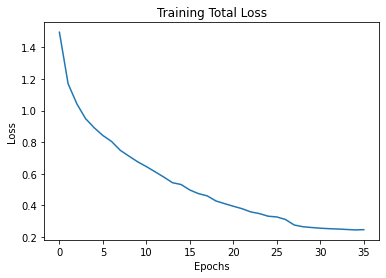

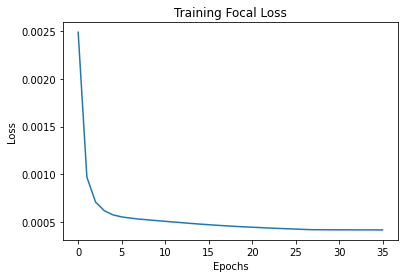

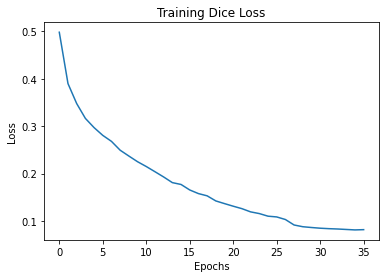

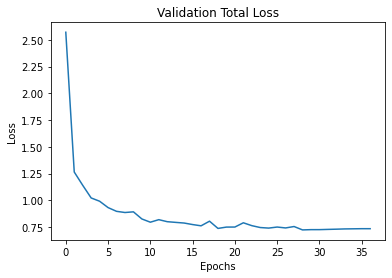

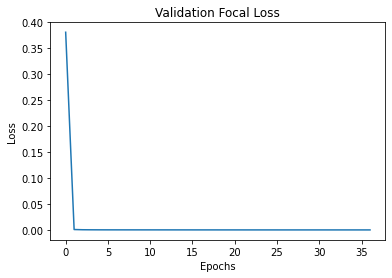

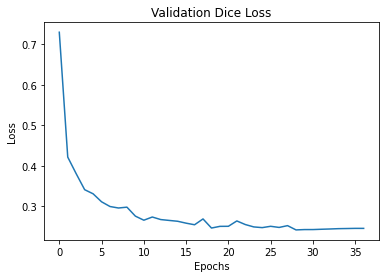

In [15]:
fig = plt.figure(1)
# training total loss
plt.plot(np.arange(max_epochs), total_loss, label='Total Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Total Loss')
plt.show()

# training cate loss
plt.plot(np.arange(max_epochs), cate_loss, label='Focal Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Focal Loss')
plt.show()

# training mask loss
plt.plot(np.arange(max_epochs), mask_loss, label='Dice Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Dice Loss')
#plt.savefig('Training Curves.png')
plt.show()

fig = plt.figure(2)
plt.plot(np.arange(max_epochs + 1), val_total_loss, label='Total Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Total Loss')
plt.show()

# training cate loss
plt.plot(np.arange(max_epochs + 1), val_cate_loss, label='Focal Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Focal Loss')
plt.show()

# training mask loss
plt.plot(np.arange(max_epochs + 1), val_mask_loss, label='Dice Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Dice Loss')
#plt.savefig('Training Curves.png')
plt.show()

### Part A Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. Should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so.

## Part B
### Loss
The loss function consists of two parts: category loss and mask loss:
$$L = \lambda_\text{cate} L_\text{cate} + \lambda_\text{mask} L_\text{mask} $$

The category loss is defined as (where $\text{FL}$ is the focal loss)

$$L_\text{cate} = \frac{1}{S^2 C} \sum_{S,S,C} \text{FL}(p_t)$$

$$\text{FL}(p_t) = -\alpha_t (1 - p_t)^\gamma \log{(p_t)}$$

$$(\alpha_t, p_t) = \left\{\begin{array}{lr} (\alpha, \hat{p}) & \text{if }y=1 \\ (1 - \alpha, 1 - \hat{p}) & \text{otherwise}\end{array}\right.$$

while the mask loss is defined as (where $d_\text{mask}$ is the dice loss)

$$L_\text{mask} = \frac{1}{N_\text{positive}} \sum_k \mathbb{1}_{\{p_{i, j} > 0\}} d_\text{mask}(m_k, \hat{m}_k)$$

$$d_\text{mask}(p, q) = 1 - D(p, q)$$

$$D(p, q) = \frac{2 \sum_{x,y}(p_{x,y} \cdot q_{x,y})}{\sum_{x,y}p_{x,y}^2 + \sum_{x,y}q_{x,y}^2}$$

### Post Processing
Post processing consists of three steps: points NMS, concatenation and sorting, and matrix NMS. A summary of each of these steps is provided below. In addition, your final mask prediction should be a binary mask based on the mask thresholding parameter. Some examples of results post-inference are shown in figs. 11-14.


<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig11.png" width=300/></div>
<center>Figure 11: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig12.png" width=300/></div>
<center>Figure 12: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig13.png" width=300/></div>
<center>Figure 13: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig14.png" width=300/></div>
<center>Figure 14: SOLO instance segmentation example.</center>

#### Points NMS
Non-max suppression for the category predictions, applied to each channel sperately. A maxpooling with a kernel size of 2, sample code is included below.

#### Concatenation and Sorting
Here, we merge the predictions across all the FPN levels into a single list of predictions, sorted by their predicted score. This involves rescaling the predicted masks appropriately.

#### Matrix NMS
Inspired by Soft-NMS, MatrixNMS suppresses mask predictions with a lower score based on their similarity to predictions with a higher score in a completely vectorized manner. Sample code is include below.

In [38]:
# Load model from checkpoint

#model_test = SOLO.load_from_checkpoint('/content/gdrive/MyDrive/Colab Notebooks/CIS 680/HW3/lightning_logs/epoch=11-step=7835.ckpt')
#model_test.eval()
model.eval()

SOLO(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=1e

RUN THE FOLLOWING CELL FOR FULL REPRODUCTION 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


DATASET VISUALIZATION


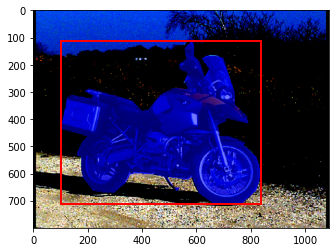

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


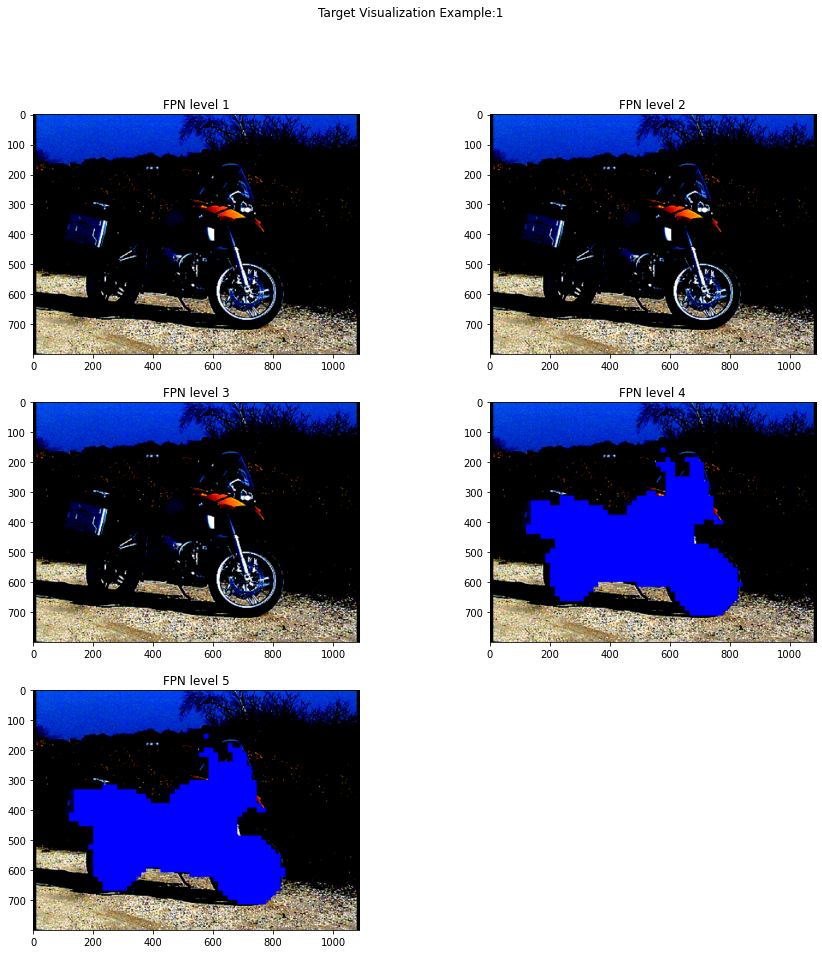

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3658: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.5393, 0.1409, 0.0823, 0.0715, 0.0686])
top 5 classes  tensor([1, 1, 1, 1, 1])
INFERENCE VISUALIZATION


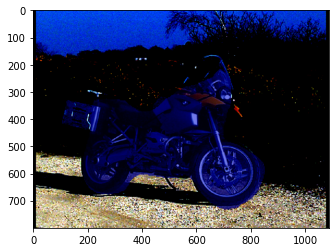

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


DATASET VISUALIZATION


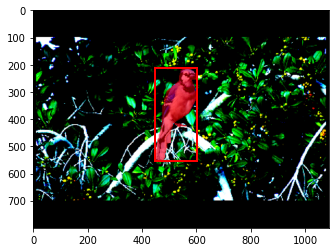

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


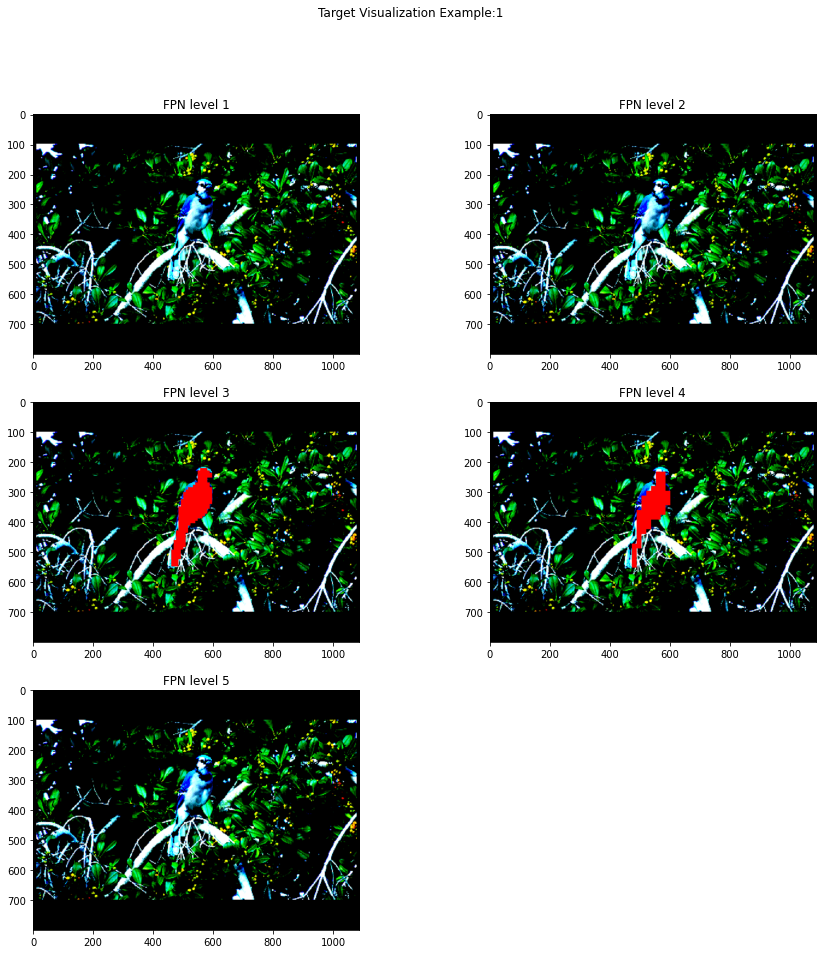

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.3397, 0.1143, 0.1088, 0.0977, 0.0863])
top 5 classes  tensor([3, 3, 3, 3, 3])
INFERENCE VISUALIZATION


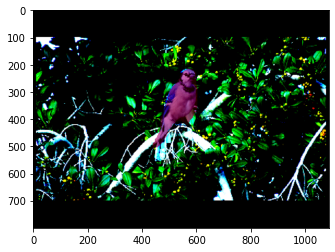

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


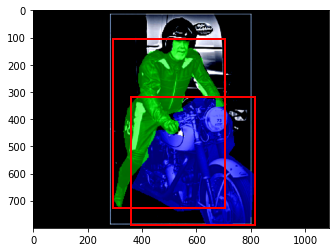

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


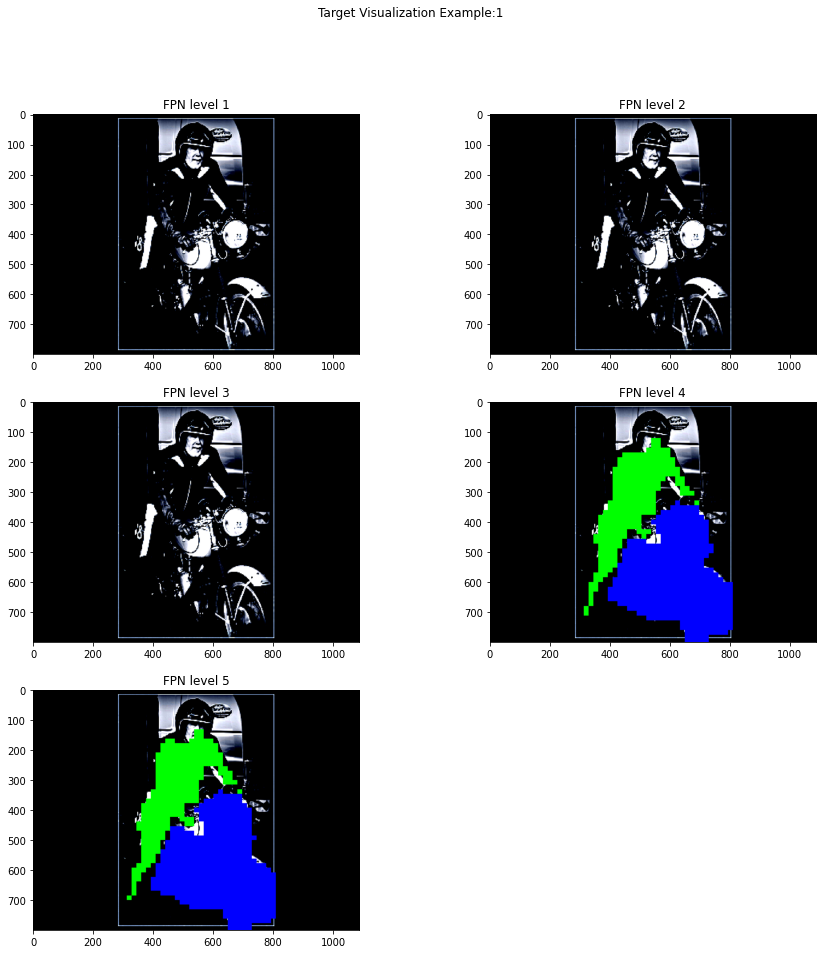

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.3509, 0.2874, 0.1672, 0.1326, 0.1304])
top 5 classes  tensor([1, 2, 1, 1, 2])
INFERENCE VISUALIZATION


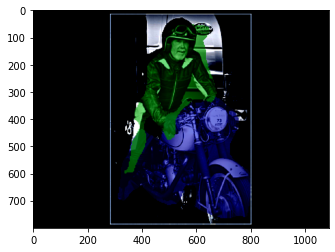

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


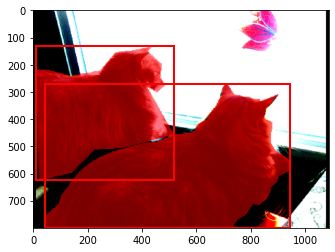

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


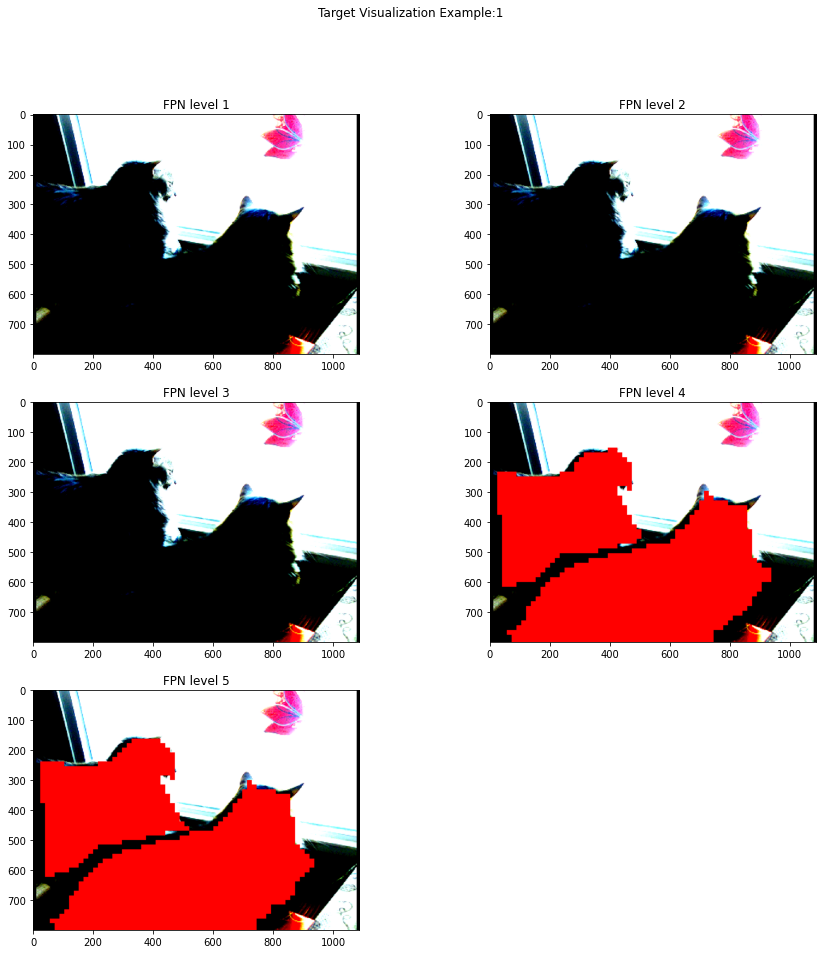

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.3879, 0.1873, 0.1766, 0.1224, 0.1145])
top 5 classes  tensor([3, 3, 3, 3, 3])
INFERENCE VISUALIZATION


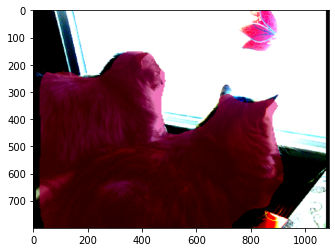

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


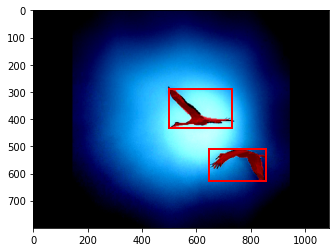

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


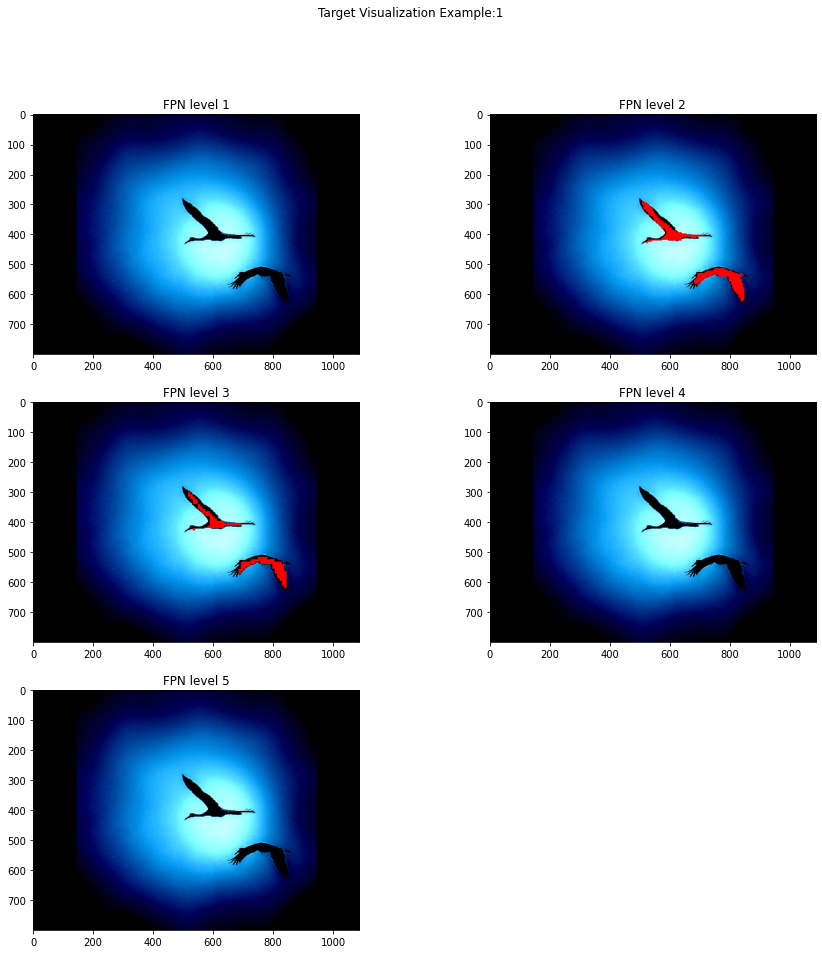

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.2624, 0.1540, 0.1137, 0.0957, 0.0954])
top 5 classes  tensor([3, 2, 3, 3, 3])
INFERENCE VISUALIZATION


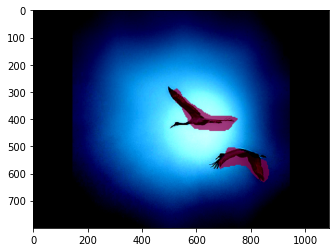

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


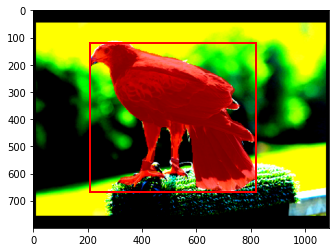

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


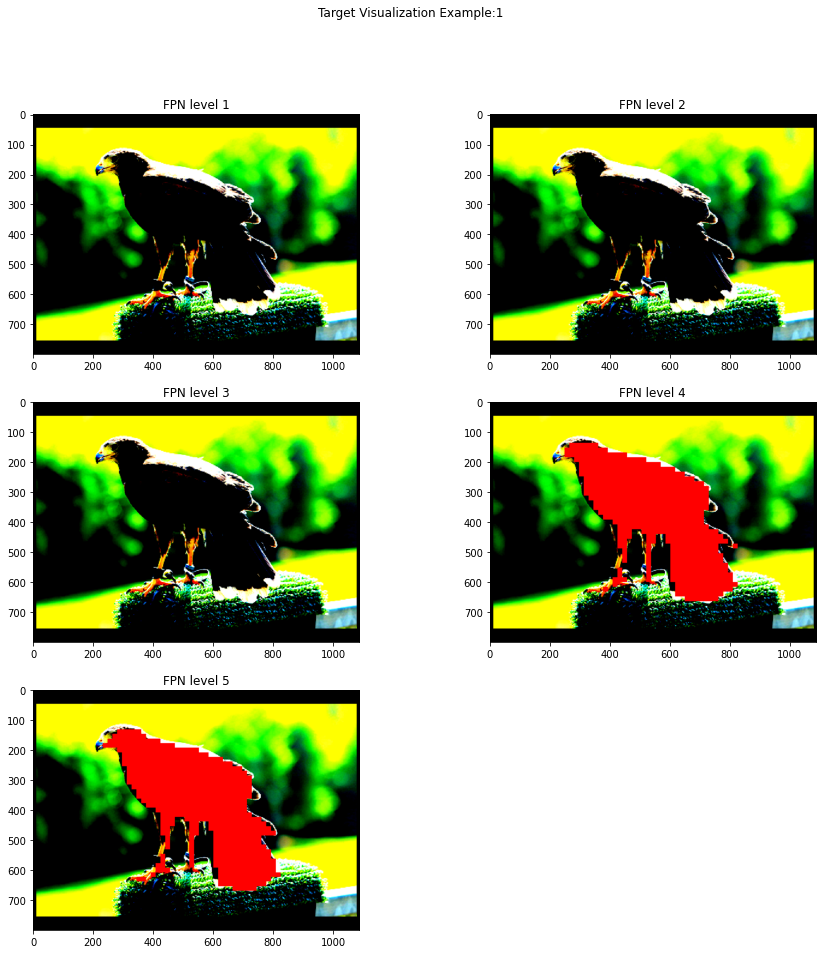

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.2994, 0.1301, 0.0827, 0.0762, 0.0679])
top 5 classes  tensor([3, 1, 2, 3, 2])
INFERENCE VISUALIZATION


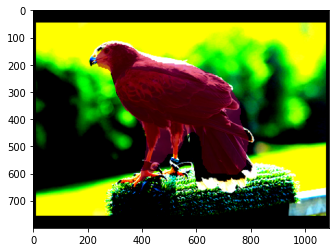

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


DATASET VISUALIZATION


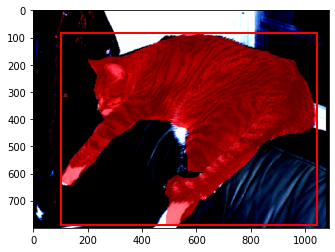

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


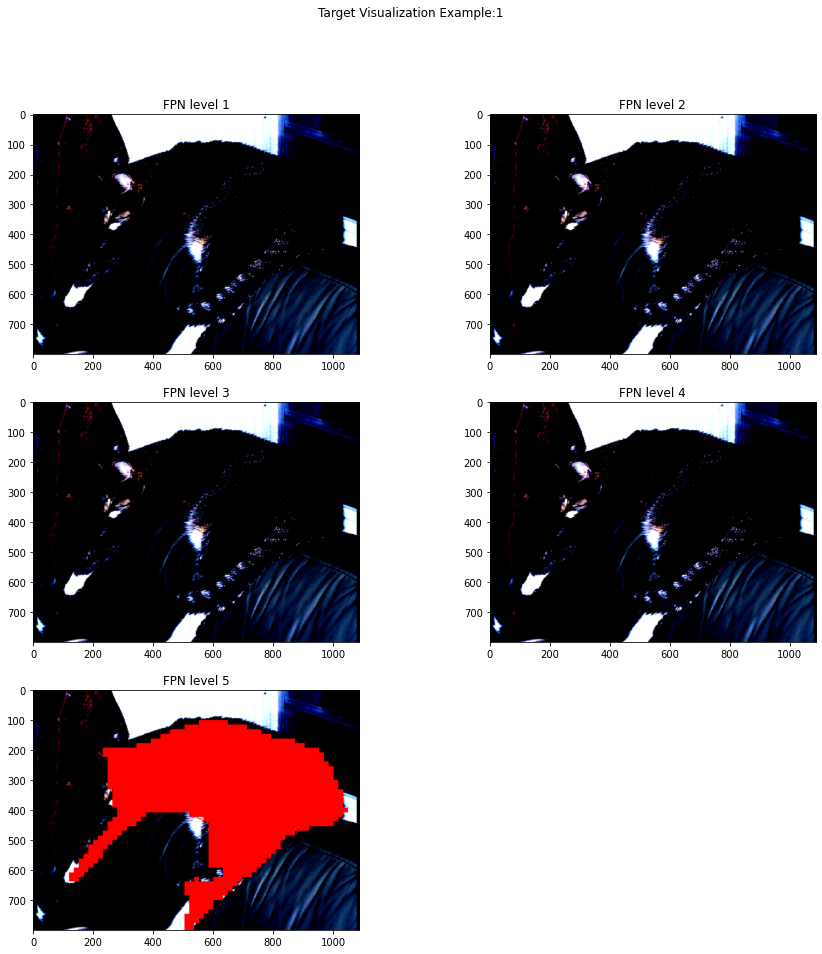

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.4148, 0.1084, 0.1017, 0.0998, 0.0886])
top 5 classes  tensor([3, 3, 3, 3, 3])
INFERENCE VISUALIZATION


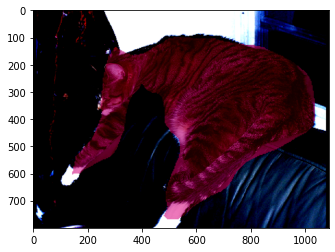

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


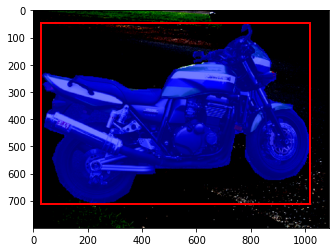

TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


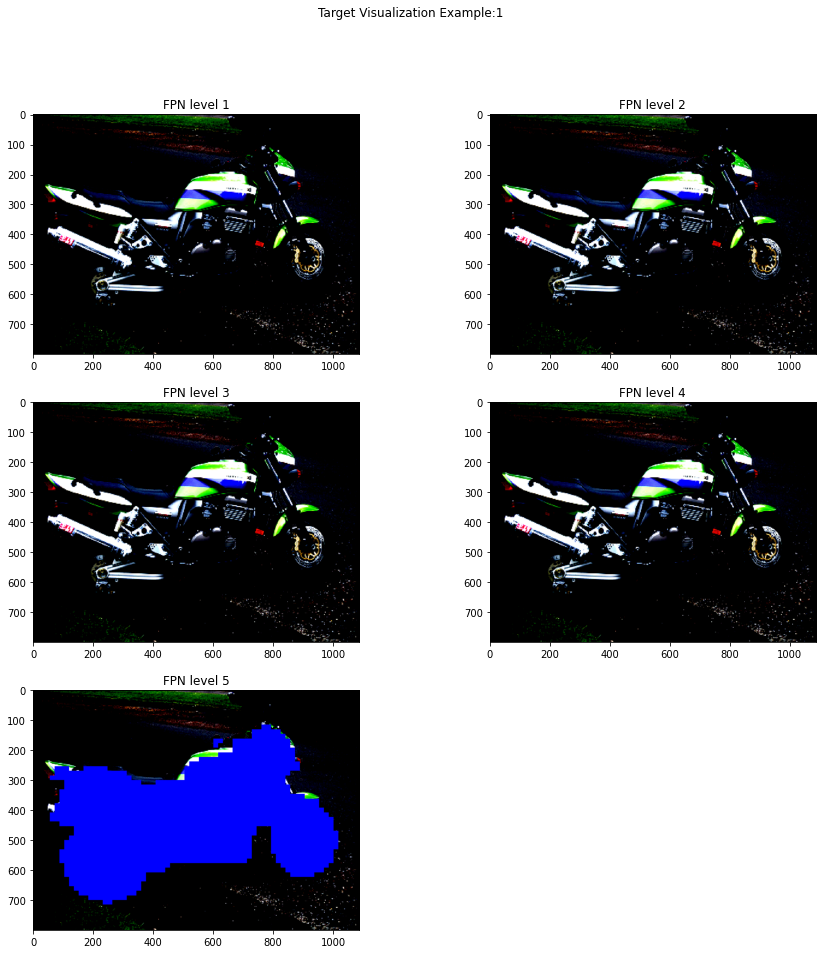

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.4320, 0.1911, 0.1753, 0.1517, 0.1193])
top 5 classes  tensor([1, 1, 1, 1, 1])
INFERENCE VISUALIZATION


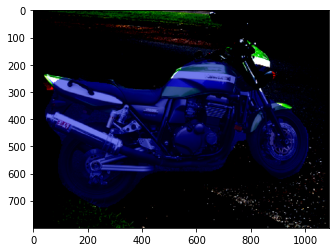

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


DATASET VISUALIZATION


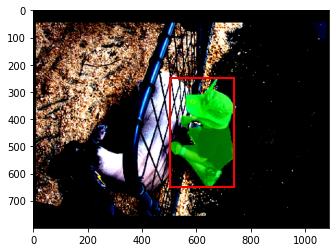

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


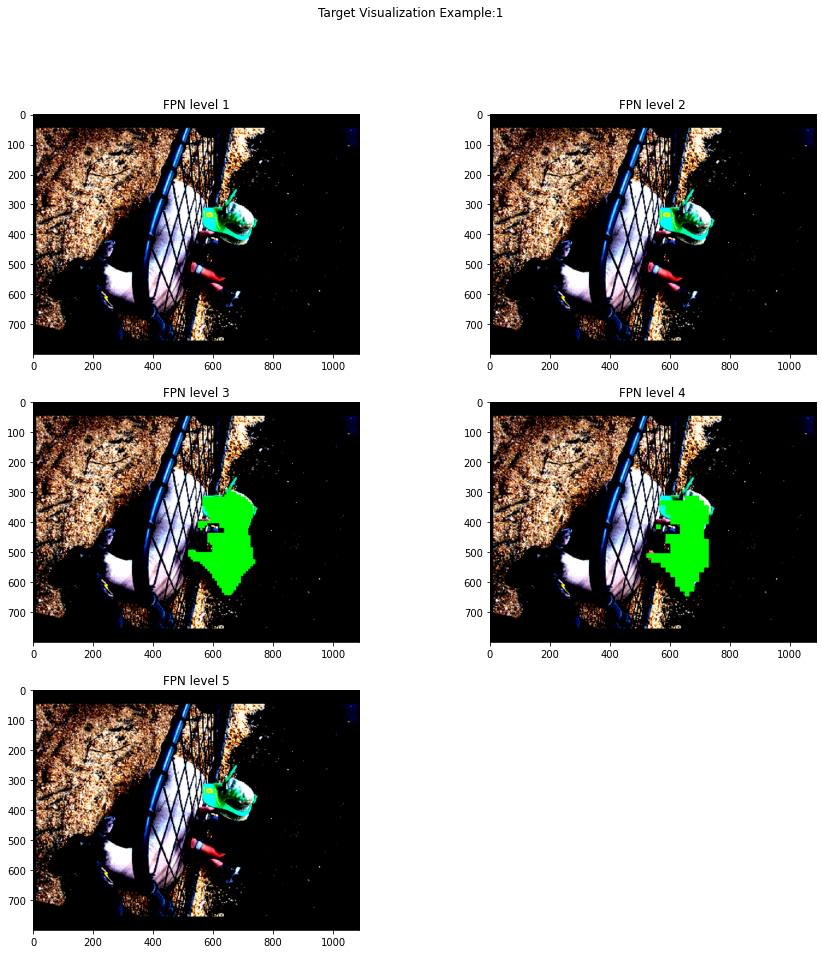

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.2572, 0.1669, 0.1143, 0.1142, 0.0833])
top 5 classes  tensor([2, 2, 2, 2, 2])
INFERENCE VISUALIZATION


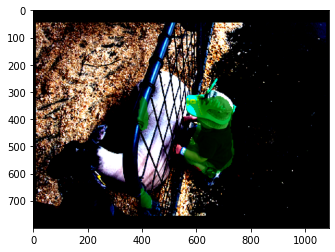

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).











DATASET VISUALIZATION


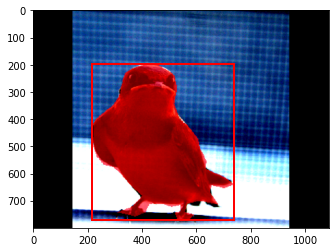

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TARGET VISUALIZATION


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


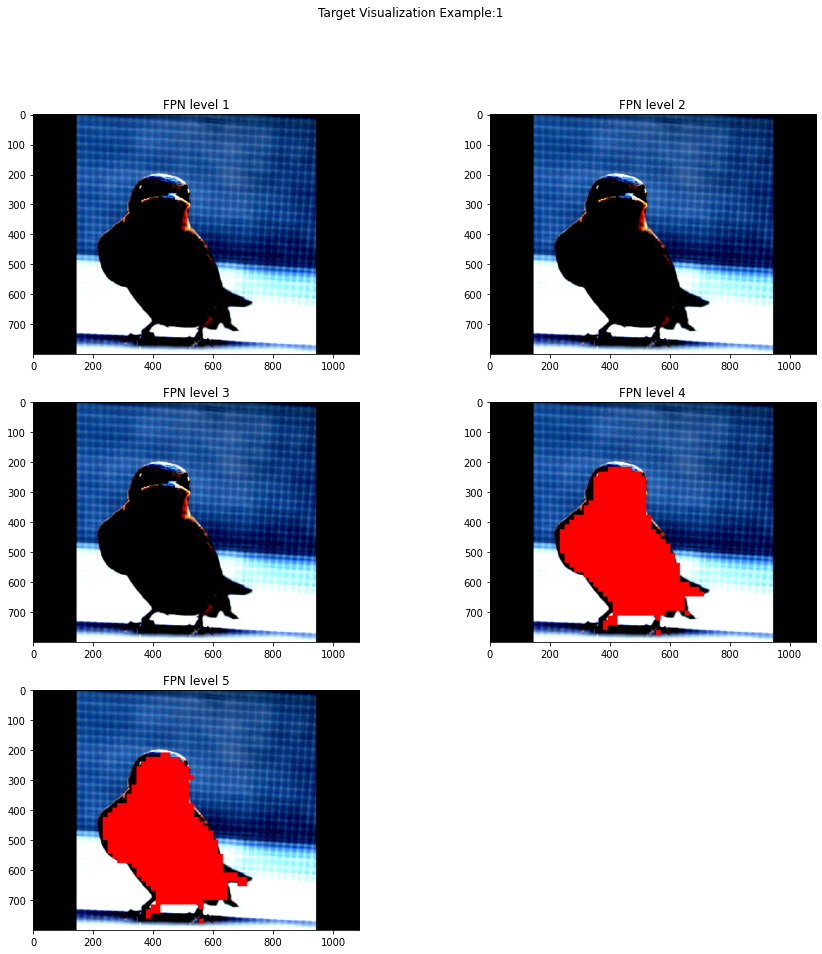

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


top 5 decay scores  tensor([0.4074, 0.2048, 0.1115, 0.0863, 0.0743])
top 5 classes  tensor([3, 3, 3, 3, 3])
INFERENCE VISUALIZATION


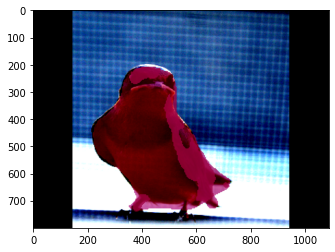

In [57]:
# Inference
# Set test loader batch size to 1
with torch.no_grad():
  for iter, data in enumerate(test_loader):
    if iter in [26, 32, 33, 36, 37, 38, 100, 101,311, 313]:
      img = data[0]
      label = data[1]
      mask = data[2]
      bbox = data[3]

      print('DATASET VISUALIZATION')
      visualize_data(img, label, mask, bbox)

      print('TARGET VISUALIZATION')
      mask_targets, active_masks, cate_targets = model.target(bbox, label, mask)
      visualize_targets(mask_targets, active_masks, cate_targets, img)
      plt.show()

      cate_preds, mask_preds = model.forward(img, eval=True)
      scores, labels, masks = model.post_process(cate_preds, mask_preds)
      scores, labels, masks = scores.unsqueeze(0), labels.unsqueeze(0), masks.unsqueeze(0)

      print('INFERENCE VISUALIZATION')
      model.plot_inference(scores, labels, masks, img)



### Training
#### Optimizer
The SGD optimizer with a weight decay of 1e-4 and a momentum of 0.9 is used. For a batch size of 16, an initial learning rate of 16 is used (this should be scaled appropriately for different batch sizes). You should train for 36 epochs, reducing the learning rate by a factor of 10 at epochs 27 and 33.

#### Data Augemnetation
To achieve better performance, you may wish to explore some data augmentation techniques. You should be able to achieve the necessary performance without any augmentation, however.

#### Checkpointing
Due to the long training time, we highly recommend that you set up regular checkpointing during your training in case your training gets interrupted (e.g. your colab session ending).

### Part B Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Final inference results such as figs. 11-14. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Training and validation loss curves. These should include the focal loss, dice loss, and total loss as seperate quantities.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.

In addition, you should include a discussion of any issues you encountered during this project and any changes you made to the siggested architecture. If you made any interesting observations or thoughts about potential improvements, you should also include them here.

There will likely be a performance benchmark for this project - more details to be announced.

In [18]:
"""# Convert to pdf
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc
!jupyter nbconvert --to latex /content/pdf_hari_cis680_hw3.ipynb
pdflatex /content/pdf_hari_cis680_hw3.ipynb"""

'# Convert to pdf\n!apt-get install texlive texlive-xetex texlive-latex-extra pandoc\n!pip install pypandoc\n!jupyter nbconvert --to latex /content/pdf_hari_cis680_hw3.ipynb\npdflatex /content/pdf_hari_cis680_hw3.ipynb'